<a href="https://colab.research.google.com/github/ShivajiMallela/Dog-Breed-Identification-using-Deep-Learning-with-MobileNetV2/blob/main/End_to_end_dog_vision_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-End Multi-Class Dog Breed Classification

In this notebook, I'll build an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

## 1. Problem

The goal is to identify the breed of a dog given an image of the dog.

When I'm at a café and take a photo of a dog, I want to determine its breed.

## 2. Data

The data I'm using comes from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation requires a file with prediction probabilities for each dog breed for every test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Here's some information about the data:
* I'm dealing with images (unstructured data), so using deep learning/transfer learning is likely the best approach.
* There are 120 breeds of dogs, which means 120 different classes.
* The training set contains around 10,000+ images with labels.
* The test set contains around 10,000+ images without labels, as I will need to predict them.


## Get our workspace ready

* Import Tensorflow 2.x ✅
* Import Tensorflow hub ✅
* Make sure we're using a GPU ✅

In [1]:
#import Necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF hub version:", hub.__version__)

#check for GPU availability
print("GPU", "Available (Yessss!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.15.0
TF hub version: 0.16.1
GPU Available (Yessss!!!!!)


## Preparing Our Data (Converting to Tensors)

I learned that for all machine learning models, our data needs to be in a numerical format. This means we need to convert our images into Tensors, which are essentially numerical representations of the data.

To start, I'll access the dataset and examine the labels to understand what we're working with. This step is crucial because it helps ensure that the data is in the right format before we begin training our model.


In [2]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/dog-breed-identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [3]:
labels_csv.shape

(10222, 2)

In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [5]:
#Displaying column names
labels_csv.breed.unique()

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'borzoi', 'basenji', 'scottish_deerhound',
       'shetland_sheepdog', 'walker_hound', 'maltese_dog',
       'norfolk_terrier', 'african_hunting_dog',
       'wire-haired_fox_terrier', 'redbone', 'lakeland_terrier', 'boxer',
       'doberman', 'otterhound', 'standard_schnauzer',
       'irish_water_spaniel', 'black-and-tan_coonhound', 'cairn',
       'affenpinscher', 'labrador_retriever', 'ibizan_hound',
       'english_setter', 'weimaraner', 'giant_schnauzer', 'groenendael',
       'dhole', 'toy_poodle', 'border_terrier', 'tibetan_terrier',
       'norwegian_elkhound', 'shih-tzu', 'irish_terrier', 'kuvasz',
       'german_shepherd', 'greater_swiss_mountain_dog', 'basset',
       'australian_terrier', 'schipperke', 'rhodesian_ridgeback',
       'irish_setter', 'appenzeller', 'bloodhound', 'samoyed',
       'miniature_schnauzer', 'brittany_spaniel', 'kelpie', 'papillon',
       'borde

In [6]:
# Displaying the count of images from each breed
labels_csv["breed"].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

<Axes: xlabel='breed'>

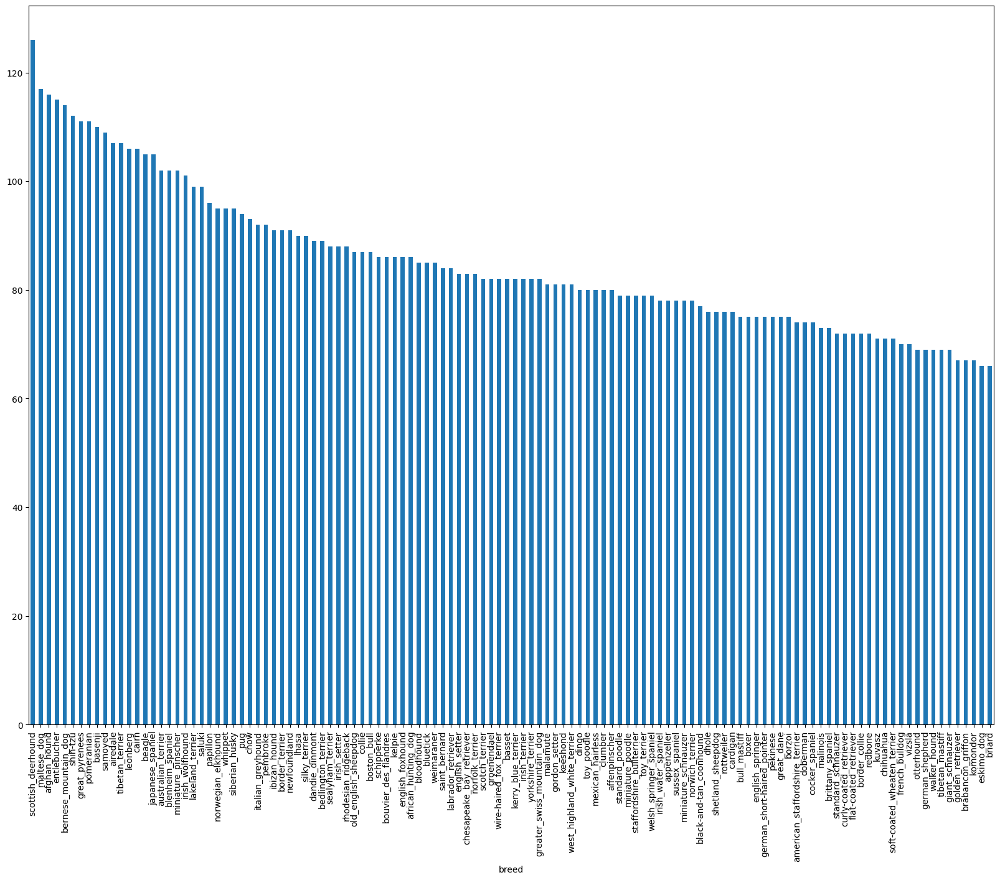

In [7]:
# plotting the bar graph
labels_csv["breed"].value_counts().plot.bar(figsize=(20,15))

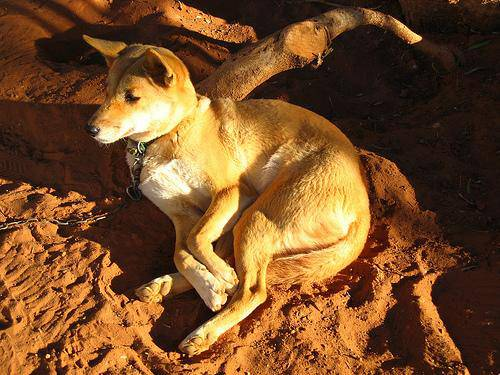

In [8]:
# Lets view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting Images and Their Labels

It's useful to create a list of all our image file pathnames. This way, I won't have to type the entire path every time I want to load an image. By doing this, I can easily access and preprocess the images.


In [9]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [10]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv['id']]
filenames[:10]

['drive/MyDrive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
# Check whether num of filenames matches num of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/dog-breed-identification/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! proceed.


In [12]:
len(os.listdir("drive/MyDrive/Dog Vision/dog-breed-identification/train/")), len(filenames)

(10222, 10222)

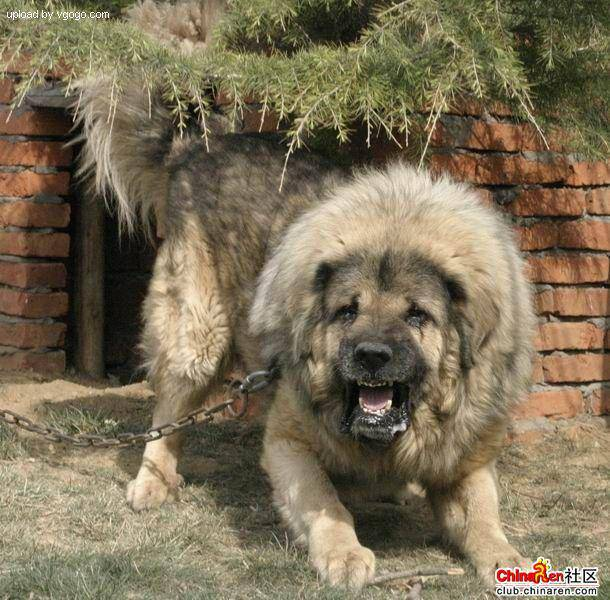

In [13]:
Image(filenames[9000])

In [14]:
labels_csv["breed"][9000]

'tibetan_mastiff'

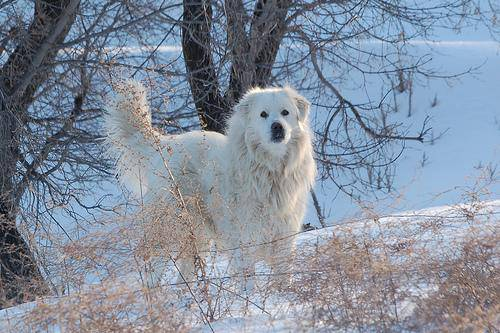

In [15]:
Image(filenames[6666])

In [16]:
labels_csv["breed"][6666]

'great_pyrenees'

Now i'm going to prepare the labels for our training images filepaths that we have created.

In [17]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels_csv["breed"]) #other way to convert the labels into numpy array
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [18]:
len(labels)

10222

In [19]:
# see if num of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [20]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [21]:
# Turn a label into an array of booleans
labels[0] == unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [22]:
# Turn every label into a boolean array
boolean_labels = [label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [23]:
len(boolean_labels)

10222

In [24]:
print(boolean_labels[0].astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### creating own validation set from training set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own by dividing the training set we have.

In [25]:
# lets set X and y variables
X = filenames
y = boolean_labels

In [26]:
len(X), len(y)

(10222, 10222)

We're going to start off experimenting with ~1000 images and increase as needed.

In [27]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [28]:
# splitting data into train and validation sets
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [29]:
X_train[:2],y_train[:2]

(['drive/MyDrive/Dog Vision/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fa

In [30]:
X_val[:2],y_val[:2]

(['drive/MyDrive/Dog Vision/dog-breed-identification/train/0ca9280205bd68d201e1d708db3f209d.jpg',
  'drive/MyDrive/Dog Vision/dog-breed-identification/train/12405b2e93417d81f5308769c4e184c7.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fa

## Preprocessing images (turning images into tensors)

Before we proceed, let's explore how to import an image.

In [31]:
# converting an image into numpy array
from matplotlib.pyplot import imread
image = imread(filenames[66])
image.shape

(375, 500, 3)

In [32]:
image.max(), image.min()

(255, 0)

In [33]:
image[:2]

array([[[102,  82,  47],
        [102,  82,  45],
        [121,  98,  57],
        ...,
        [251, 255, 236],
        [249, 254, 234],
        [249, 254, 234]],

       [[192, 169, 135],
        [219, 197, 160],
        [195, 172, 130],
        ...,
        [251, 255, 241],
        [250, 254, 240],
        [250, 254, 240]]], dtype=uint8)

In [34]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[102,  82,  47],
        [102,  82,  45],
        [121,  98,  57],
        ...,
        [251, 255, 236],
        [249, 254, 234],
        [249, 254, 234]],

       [[192, 169, 135],
        [219, 197, 160],
        [195, 172, 130],
        ...,
        [251, 255, 241],
        [250, 254, 240],
        [250, 254, 240]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

Create a function to:

1. Take an image file path as input.
2. Use TensorFlow to read the image file and store it in a variable called image.
3. Convert the image into a tensor representation.
4. Normalize the image by scaling the color channel values from 0-255 to 0-1.
5. Resize the image to a shape of (224, 224).
6. Return the modified image.

You can find more information on how to load and preprocess images in TensorFlow in the official documentation at this link:
https://www.tensorflow.org/tutorials/load_data/images

In [35]:
# Define image size
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # Read image
  image = tf.io.read_file(image_path)
  # Turn the jpeg into numerical Tensor with 3 colour channels (red, blue, green)
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=(IMG_SIZE, IMG_SIZE))

  return image

## Turning our data into batches
**Why Turn Our Data into Batches?**

When working with large datasets, such as 10,000+ images, processing them all at once can overwhelm your memory. To manage this, we process the images in smaller groups, called batches. Typically, a batch size is around 32 images, but you can adjust this number based on your needs and system capacity.

For TensorFlow to work efficiently, our data should be in the form of Tensor tuples, which look like this:
`(image, label)`

In [36]:
# Creating a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [37]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [38]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels and we don't need to shuffle it
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image) and turns data into batches
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

  return data_batch

In [39]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [40]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [41]:
#import matplotlib
import matplotlib.pyplot as plt

# create a function to visualize the images in a data batch
def show_25_images(images, labels):

  plt.figure(figsize=(10,10))

  for i in range(25):
    plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

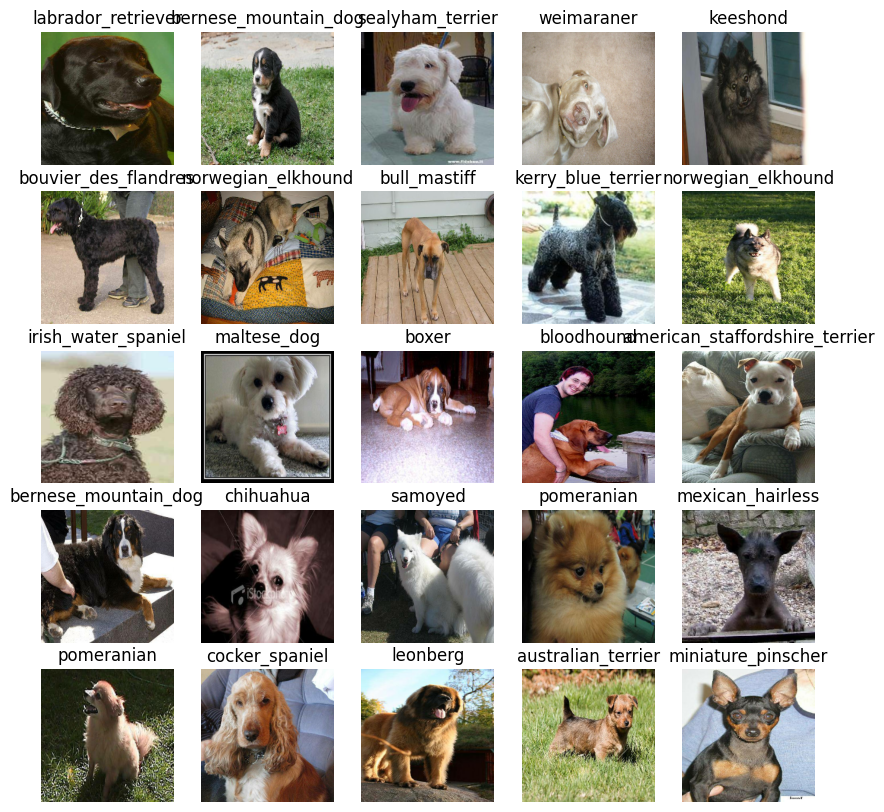

In [42]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

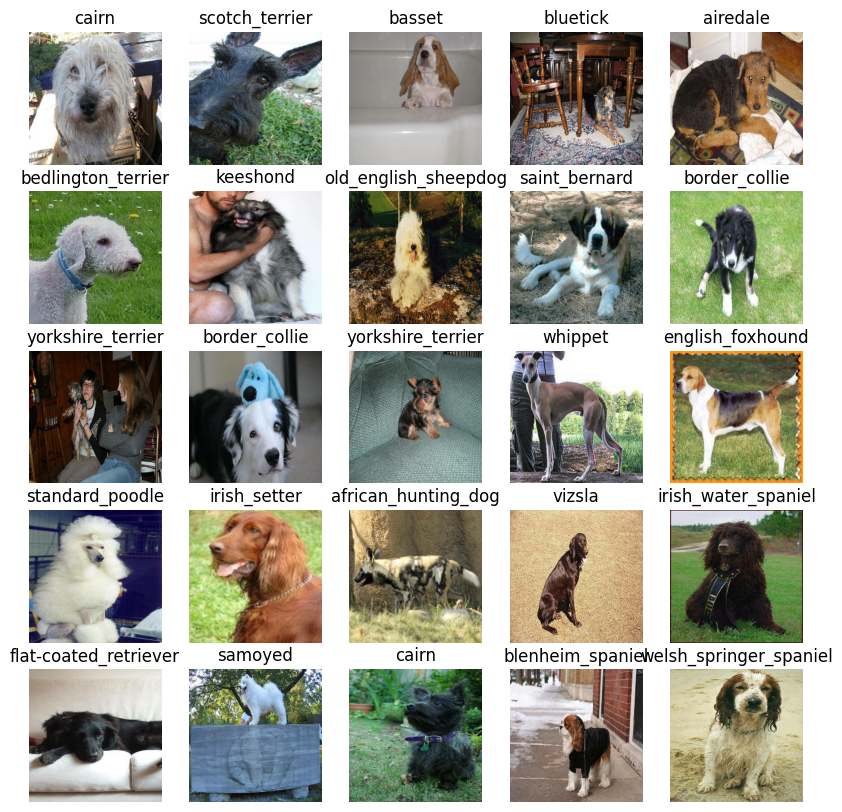

In [43]:
# Now let's visualize the data in a Validation training batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

Before building a deep learning model, we need to define the following key components:

* Input Shape: The shape of our input images in the form of Tensors.
* Output Shape: The shape of the image labels in the form of Tensors.
* Model URL: The URL of the pre-trained model we want to use from TensorFlow Hub. - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [44]:
# setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE ,IMG_SIZE, 3] # batch, height, width, colour channels

# setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# setup model url from Tensorflow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now that we have our inputs, outputs, and chosen model, let's create a function to build a Keras deep learning model. This function will:

1. Take the input shape, output shape, and model URL as parameters.
2. Define the layers in a Keras model sequentially.
3. Compile the model, specifying the evaluation and improvement metrics.
4. Build the model, defining the input shape.
5. Return the built model.


All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [45]:
# create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(model_url), # layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 output layer
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [46]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating Callbacks

Callbacks are essential tools that a model can use during training to perform tasks like saving its progress, monitoring its performance, or stopping training early if it stops improving.

We'll create two important callbacks: one for TensorBoard, which helps track the model's progress, and another for early stopping, which prevents the model from training for too long without improvement.

### TensorBoard Callback

To set up a TensorBoard callback, we need to follow these steps:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model's training logs using the `%tensorboard` magic function after the model has been trained.

For more details on TensorBoard callbacks, refer to the [TensorFlow documentation](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard).


In [47]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [48]:
import datetime

# create a funcition to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Dog Vision/dog-breed-identification/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))


  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping is a technique used to prevent overfitting by halting the training process if a specified evaluation metric ceases to improve.

For more information, refer to the [TensorFlow documentation on EarlyStopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping).


In [49]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [50]:
NUM_EPOCHS = 100 # @param {type:"slider", min:10, max:100, step:10}

In [51]:
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!!)


Let's create a function to train a model.

- Initialize the model using `create_model()`.
- Set up a TensorBoard callback using `create_tensorboard_callback()`.
- Train the model by calling its `fit()` function, passing in the training data, validation data, number of epochs (`NUM_EPOCHS`), and the desired callbacks.
- Return the trained model.

In [52]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # create a model
  model = create_model()

  # create a tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # fit the model to the data passing callbacks we created into it
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data = val_data,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model


In [53]:
  # Fit the model to the data
  model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 326s 13s/step - loss: 4.6532 - accuracy: 0.0725 - val_loss: 3.6769 - val_accuracy: 0.2000
Epoch 2/100
25/25 [==============================] - 4s 176ms/step - loss: 1.7165 - accuracy: 0.6575 - val_loss: 2.3226 - val_accuracy: 0.4600
Epoch 3/100
25/25 [==============================] - 4s 147ms/step - loss: 0.6080 - accuracy: 0.9325 - val_loss: 1.8040 - val_accuracy: 0.5750
Epoch 4/100
25/25 [==============================] - 5s 190ms/step - loss: 0.2717 - accuracy: 0.9812 - val_loss: 1.5855 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 4s 163ms/step - loss: 0.1574 - accuracy: 0.9937 - val_loss: 1.4978 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 4s 176ms/step - loss: 0.1066 - accuracy: 0.9987 - val_loss: 1.4581 - val_accuracy: 0.6250
Epoch 7/100
25/25 [==============================


**Question:** It appears that our model is overfitting, as it performs significantly better on the training dataset compared to the validation dataset. What are some strategies to prevent overfitting in deep learning neural networks?

**Note:** Initial overfitting is actually positive! It indicates that our model is learning!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [54]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/dog-breed-identification/logs

<IPython.core.display.Javascript object>

# Making and evaluating predictions using a trained model

In [55]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [56]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 218ms/step


array([[1.0205917e-03, 1.9820766e-04, 1.9044711e-03, ..., 2.6631608e-04,
        6.1187311e-05, 1.1009632e-03],
       [1.4976192e-03, 1.3868550e-03, 2.2062028e-02, ..., 3.2135153e-03,
        4.3877303e-03, 1.2603895e-04],
       [8.0870821e-05, 5.1327519e-05, 1.6918015e-05, ..., 5.4495842e-05,
        4.0279058e-04, 5.0376967e-04],
       ...,
       [2.4199435e-05, 8.8102615e-04, 1.0323719e-04, ..., 4.6371509e-04,
        4.6151027e-04, 3.4136832e-04],
       [2.6795664e-03, 5.1486201e-04, 9.4312403e-05, ..., 4.1046561e-04,
        8.5830427e-05, 1.7311944e-02],
       [1.4433074e-04, 1.0298635e-04, 1.5401432e-02, ..., 6.8299235e-03,
        1.6335838e-03, 3.0260193e-04]], dtype=float32)

In [57]:
# Creating dataframe of predictions to understand them clearly
pred_dataframe = pd.DataFrame(predictions, columns=unique_breeds)
pred_dataframe

,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,0.001021,0.000198,0.001904,0.000119,0.000159,0.000026,0.030807,0.000148,0.000241,0.000248,...,0.001221,0.000060,0.000004,0.000402,0.000259,0.000188,0.002292,0.000266,0.000061,0.001101
1,0.001498,0.001387,0.022062,0.004291,0.000712,0.000036,0.020865,0.001392,0.000683,0.000449,...,0.000083,0.001537,0.000073,0.000451,0.000338,0.001143,0.004436,0.003214,0.004388,0.000126
2,0.000081,0.000051,0.000017,0.000100,0.000282,0.000553,0.000147,0.003343,0.783380,0.032856,...,0.000954,0.000077,0.000103,0.002308,0.006416,0.001997,0.000165,0.000054,0.000403,0.000504
3,0.014583,0.001389,0.000071,0.004116,0.000114,0.003223,0.028184,0.000238,0.028082,0.096046,...,0.006897,0.000710,0.000015,0.002110,0.000016,0.000457,0.004274,0.000245,0.000184,0.296213
4,0.000018,0.000022,0.000012,0.963909,0.000024,0.000502,0.000368,0.000552,0.000134,0.000010,...,0.000046,0.000107,0.000061,0.000339,0.000014,0.000024,0.000010,0.000015,0.004483,0.000551
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0.048231,0.000727,0.000668,0.000473,0.000054,0.003454,0.003110,0.006124,0.000779,0.000139,...,0.003174,0.000269,0.001417,0.000376,0.000310,0.000006,0.000006,0.000156,0.000152,0.008535
196,0.002638,0.004570,0.000950,0.018888,0.004095,0.000163,0.007327,0.002392,0.000721,0.000111,...,0.001962,0.001402,0.000285,0.006583,0.000339,0.029360,0.000150,0.007670,0.008175,0.002271
197,0.000024,0.000881,0.000103,0.000181,0.000037,0.000091,0.000014,0.000033,0.002609,0.000115,...,0.000876,0.000218,0.000005,0.002543,0.000491,0.000031,0.000103,0.000464,0.000462,0.000341
198,0.002680,0.000515,0.000094,0.000488,0.001348,0.000171,0.000751,0.000410,0.000658,0.000613,...,0.002726,0.000568,0.000034,0.000127,0.000230,0.000093,0.033768,0.000410,0.000086,0.017312


In [58]:
# Prediction
index = 96
print(predictions[index]) #prints the array of prediction probability values of given index
print(f"\nMax value (probability of prediction): {np.max(predictions[index])}") #prints the maximum value in the above array
print(f"Sum: {np.sum(predictions[index])}") # prints the sum of all the values in the array
print(f"Max index: {np.argmax(predictions[index])}") # prints the index of the maximum value in the array
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}") #prints the actual label associated to the maximum value in the array

[2.63324637e-05 6.32509706e-04 9.50072135e-04 1.43983203e-03
 6.71222049e-04 3.25766232e-05 2.22004275e-03 7.49325904e-04
 2.52390455e-04 3.15669837e-04 9.11853916e-04 7.56223127e-03
 5.27083932e-04 3.32335068e-04 3.77612276e-04 1.80711690e-02
 3.16589475e-02 3.81911559e-05 6.68586371e-03 5.67791867e-04
 2.75962102e-05 9.49256901e-06 8.19409033e-05 3.80919414e-06
 4.12469002e-04 8.28232660e-05 7.63720745e-05 2.17542425e-02
 1.70058152e-03 1.59124043e-04 6.85549050e-04 1.98532478e-03
 7.67612364e-04 5.79498589e-01 1.11968326e-03 3.71561409e-03
 1.45981016e-04 5.79683983e-04 2.69470649e-04 3.12343030e-03
 1.60769990e-03 9.53206327e-04 4.86602730e-05 1.95992558e-04
 1.63406672e-04 5.46931587e-05 1.30164961e-03 3.36458354e-04
 1.71065418e-04 2.88120215e-03 4.96767112e-04 2.28918463e-04
 5.45665622e-03 1.60471958e-04 4.66927275e-04 5.65312163e-04
 1.37404341e-03 3.98469856e-03 6.33134041e-04 2.33257730e-02
 1.46029424e-03 5.54102426e-03 1.06126005e-04 1.69869955e-03
 3.52178002e-04 1.171172

In [59]:
unique_breeds[33]

'collie'

Having this functionality is excellent, but we aim to scale it.

It would be even better if we could visualize the image on which the prediction is being made!

Note: Prediction probabilities are also referred to as confidence levels.

In [60]:
# Turn the prediction probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]


In [61]:
# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[96])
pred_label

'collie'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [62]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [63]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels


In [64]:

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we have methods to obtain:
* Prediction labels
* Validation labels (true labels)
* Validation images

Let's create a function to visualize these elements more effectively.

We'll design a function that:
* Accepts an array of prediction probabilities, an array of true labels, an array of images, and an integer. ✅
* Converts the prediction probabilities to a predicted label. ✅
* Plots the predicted label, its predicted probability, the true label, and the target image on a single plot. ✅


In [65]:
def plot_pred(prediction_probabilities, labels, images, n=1):

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  plt.title("Pred={} {:2.0f}% Actual={}".format(pred_label, np.max(pred_prob)*100, true_label))

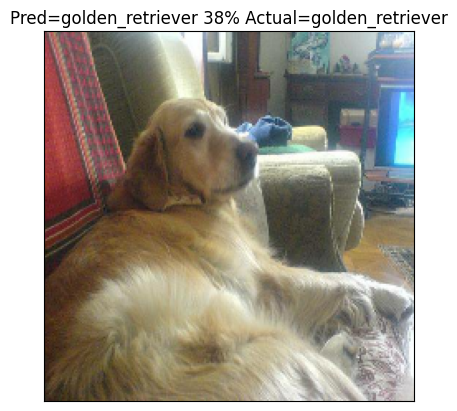

In [66]:
plot_pred(predictions,
          labels=val_labels,
          images=val_images,
          n=138)

Now that we have a function to visualize our model's top prediction, let's create another function to view our model's top 10 predictions.

This function will:
* Accept an array of prediction probabilities, an array of ground truth labels, and an integer. ✅
* Determine the prediction using `get_pred_label()`. ✅
* Identify the top 10:
  * Prediction probabilities indexes. ✅
  * Prediction probabilities values. ✅
  * Prediction labels. ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green. ✅


In [67]:
def plot_pred_conf(prediction_probabilities, labels, n=1):

  pred_prob, true_label = prediction_probabilities[n],labels[n]

  # Get the prediction label
  pred_label = get_pred_label(pred_prob)

  # Top 10 prediction indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Top 10 prediction values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #set up plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # change the colour of the true label if it's in predictions
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

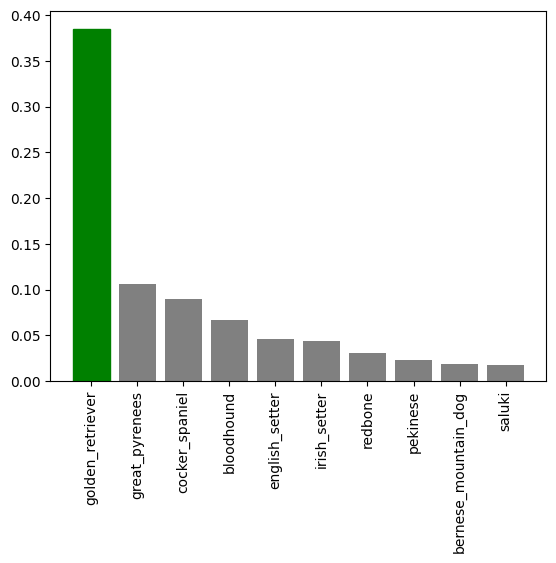

In [68]:
plot_pred_conf(predictions,
               labels=val_labels,
               n=138)

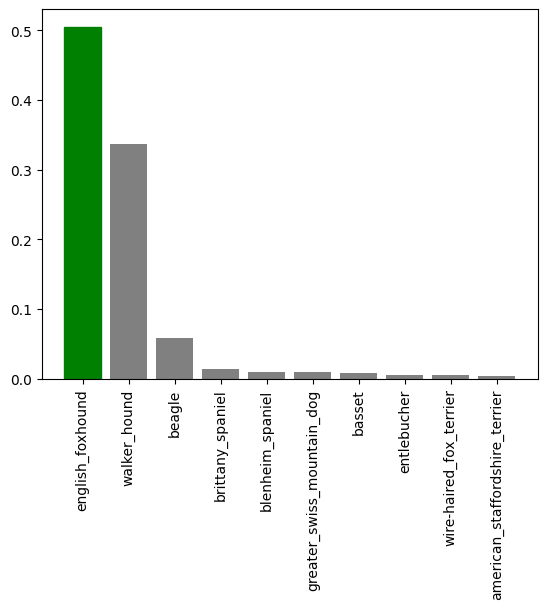

In [69]:
plot_pred_conf(predictions,
               labels=val_labels,
               n=42)

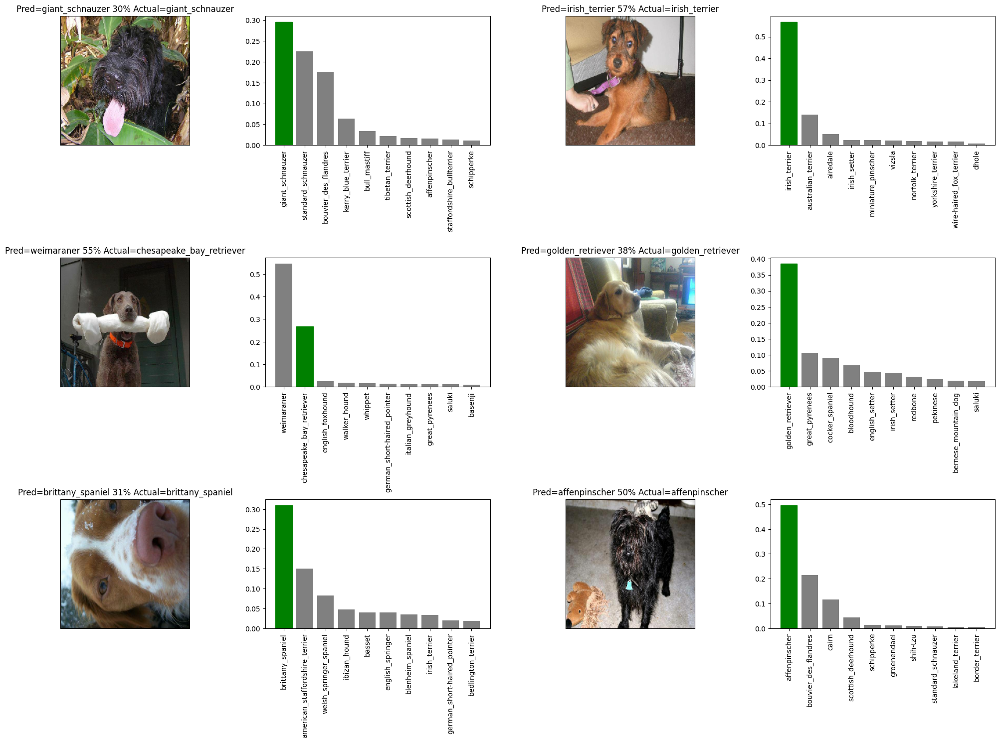

In [70]:
# Let's check out a few predictions and their different values
i_multiplier = 135
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1) # (2*i+1) in this it calculates multiplication first and addition next
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Create confusion matrix

In [71]:
# Get the indices of the maximum probabilities
cm_pred_indices = np.argmax(predictions, axis=1)

# Map the indices to the actual breed names
predicted_labels = np.array(unique_breeds[cm_pred_indices])

predicted_labels.dtype

dtype('O')

In [72]:
val_labels=np.array(val_labels)
val_labels.dtype

dtype('<U27')

In [73]:
unique_breeds.dtype

dtype('O')

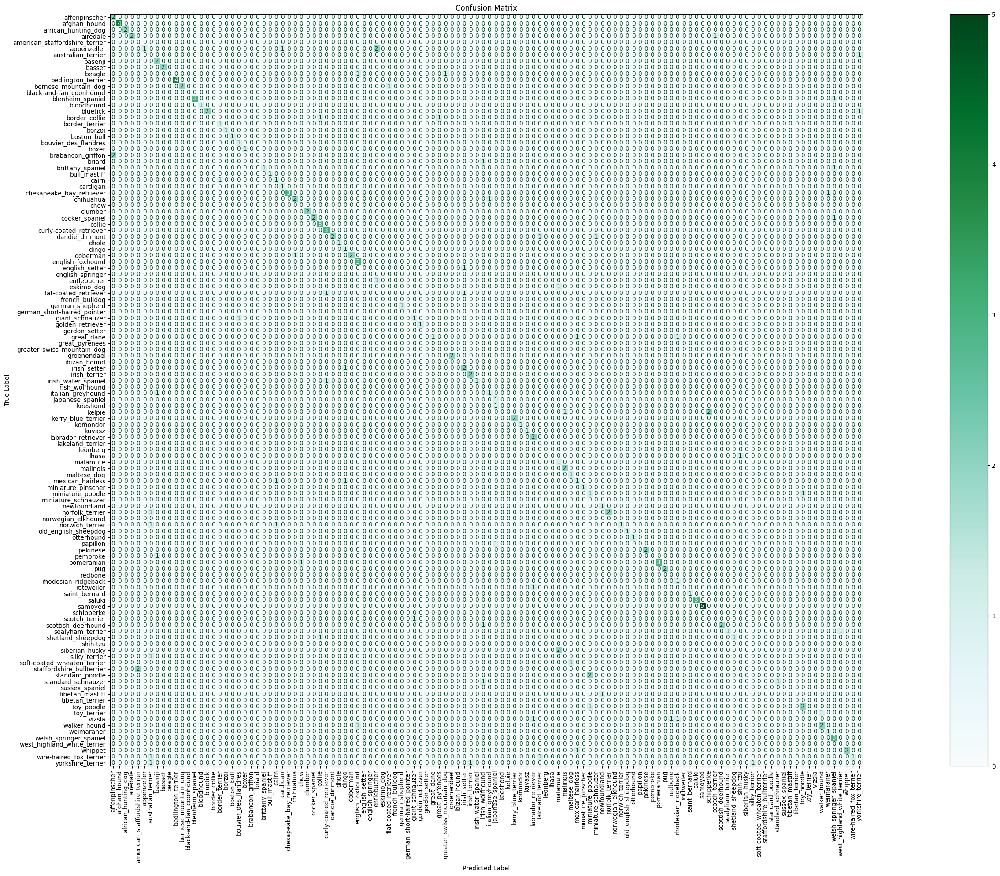

In [74]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_true=val_labels, y_pred=predicted_labels, labels=unique_breeds)

# Set up plot with a larger figure size for better readability
plt.figure(figsize=(40, 20))

# Create confusion matrix display
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=unique_breeds)

# Plot the confusion matrix
disp.plot(cmap=plt.cm.BuGn, ax=plt.gca())

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Add title and labels
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")

# Adjust layout to ensure everything fits
plt.tight_layout()

# Show the plot
plt.show()

# Saving and reloading a trained model

In [75]:
#create a function to save model
def save_model(model, suffix=None):

  modeldir = os.path.join("drive/MyDrive/Dog Vision/dog-breed-identification/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir+"-"+suffix+".h5"
  print(f"saving model to: {model_path}....")
  model.save(model_path)
  return model

In [76]:
#Create a function to load a model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [77]:
# Save our model
save_model(model, suffix="1000-images-mobilenetv2-Adam")

saving model to: drive/MyDrive/Dog Vision/dog-breed-identification/models/20240615-00341718411689-1000-images-mobilenetv2-Adam.h5....


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [78]:
# load our model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/dog-breed-identification/models/20240610-18011718042513-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/dog-breed-identification/models/20240610-18011718042513-1000-images-mobilenetv2-Adam.h5


In [79]:
# Evaluating saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 124ms/step - loss: 1.3940 - accuracy: 0.6300


[1.3940223455429077, 0.6299999952316284]

In [80]:
# Evaluating loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 108ms/step - loss: 1.2942 - accuracy: 0.6550


[1.2942384481430054, 0.6549999713897705]

# Training model with full dataset 🐕

In [81]:
# Total images in our dataset
len(X), len(y)

(10222, 10222)

In [82]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [83]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [84]:
# Create a model for full data
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [85]:
# Create full model call backs
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1282s 4s/step - loss: 1.3318 - accuracy: 0.6667
Epoch 2/100
320/320 [==============================] - 47s 148ms/step - loss: 0.4002 - accuracy: 0.8845
Epoch 3/100
320/320 [==============================] - 47s 148ms/step - loss: 0.2365 - accuracy: 0.9375
Epoch 4/100
320/320 [==============================] - 43s 135ms/step - loss: 0.1532 - accuracy: 0.9661
Epoch 5/100
320/320 [==============================] - 47s 146ms/step - loss: 0.1066 - accuracy: 0.9791
Epoch 6/100
320/320 [==============================] - 46s 143ms/step - loss: 0.0769 - accuracy: 0.9863
Epoch 7/100
320/320 [==============================] - 46s 143ms/step - loss: 0.0579 - accuracy: 0.9917
Epoch 8/100
320/320 [==============================] - 47s 146ms/step - loss: 0.0460 - accuracy: 0.9940
Epoch 9/100
320/320 [==============================] - 46s 143ms/step - loss: 0.0369 - accuracy: 0.9967
Epoch 10/100
320/320 [==============================] - 46s 144ms

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

saving model to: drive/MyDrive/Dog Vision/dog-breed-identification/models/20240611-19031718132607-full-image-set-mobilenetv2-Adam.h5....


In [86]:
# Load the saved full model
loaded_full_model = load_model("/content/drive/MyDrive/Dog Vision/dog-breed-identification/models/20240611-19031718132607-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dog Vision/dog-breed-identification/models/20240611-19031718132607-full-image-set-mobilenetv2-Adam.h5


# Making predicitons on the test dataset



Since our model has been trained on images in the form of Tensor batches, we need to format the test data similarly to make predictions.

Fortunately, we previously created `create_data_batches()`, which can take a list of filenames and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Retrieve the test image filenames. ✅
* Convert the filenames into test data batches using `create_data_batches()` and set the `test_data` parameter to `True` (as the test data doesn't have labels). ✅
* Generate a predictions array by passing the test batches to the `predict()` method on our model.


In [87]:
# Load test images filenames
test_path = "drive/MyDrive/Dog Vision/dog-breed-identification/test/"
test_filenames = [test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/dog-breed-identification/test/e826c0ae5dd27876781c10e1be444fd5.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e7ce78e874945f182a4f5149aa505b09.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e7fcdf9671a6593b638cbee42842f981.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e7b608110b0e29120d8740f37e85f3d0.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e7dc8cc599049ea9fa2a172c88646c57.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e807c4b5025b0aa4dcbd5df2765aa8e4.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e806a67a05289ac6de6831001664b81b.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e8763575a23f1e1a86788b82bd105f07.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e864985e40823a56d3ad8594066d0641.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e86bb44f11c953a6d69c548e756f5a3b.jpg']

In [88]:
len(test_filenames)

10370

In [89]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [90]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (approximately ~1 hour). This is because we need to process ~10,000+ images, have our model identify patterns in those images, and generate predictions based on what it has learned from the training dataset.


In [91]:
# Make predicitons on test_data batch using the loaded full model
test_predicitons = loaded_full_model.predict(test_data, verbose=1)

325/325 [==============================] - 254s 764ms/step


In [93]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/dog-breed-identification/preds_array.csv", test_predicitons, delimiter=",")

In [94]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/dog-breed-identification/preds_array.csv", delimiter=",")

In [95]:
test_predictions[:10]

array([[1.47971344e-10, 9.74490177e-09, 1.30831379e-09, ...,
        1.18843344e-08, 1.01027478e-10, 3.90619981e-10],
       [4.42622849e-07, 6.90525526e-10, 4.33455989e-06, ...,
        3.62044061e-10, 3.66157504e-09, 1.85208603e-06],
       [1.03733999e-14, 1.55588772e-13, 6.28068196e-15, ...,
        5.46081019e-12, 2.05980032e-14, 1.34151530e-16],
       ...,
       [1.33481581e-09, 1.21370327e-08, 3.97358368e-10, ...,
        7.61716912e-09, 5.38578071e-11, 3.35891102e-08],
       [2.54548667e-07, 5.30894688e-08, 9.72632915e-06, ...,
        6.24351611e-04, 6.76876539e-07, 2.14311797e-07],
       [5.15836644e-11, 2.77764234e-09, 1.64468647e-11, ...,
        4.02593167e-11, 1.52164273e-12, 3.90686061e-08]])

In [96]:
test_predictions.shape

(10370, 120)

# Preparing Test Dataset Predictions for Kaggle

According to the Kaggle sample submission, our model's prediction probability outputs need to be in a DataFrame with an ID column and a column for each dog breed.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To format the data correctly, we'll:
* Create a pandas DataFrame with an ID column and columns for each dog breed.
* Populate the ID column by extracting the test image IDs from their filepaths.
* Populate the dog breed columns with the prediction probabilities.
* Export the DataFrame as a CSV file for submission to Kaggle.


In [97]:
# Create a pandas dataframe with empty columns
preds_df = pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [98]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [99]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e826c0ae5dd27876781c10e1be444fd5,1.479713e-10,9.744902e-09,1.308314e-09,5.098667e-11,9.173795e-07,1.257830e-11,8.747500e-08,2.780229e-08,3.644055e-11,...,2.509965e-08,4.927238e-07,3.898463e-08,4.039805e-12,8.944052e-04,2.511431e-12,2.595100e-11,1.188433e-08,1.010275e-10,3.906200e-10
1,e7ce78e874945f182a4f5149aa505b09,4.426228e-07,6.905255e-10,4.334560e-06,1.492296e-13,9.327801e-10,1.136780e-07,9.120159e-09,2.070554e-08,3.890607e-11,...,2.635038e-07,1.291547e-08,4.151665e-09,3.500520e-11,9.707970e-09,2.129773e-10,1.946318e-09,3.620441e-10,3.661575e-09,1.852086e-06
2,e7fcdf9671a6593b638cbee42842f981,1.037340e-14,1.555888e-13,6.280682e-15,2.566470e-12,2.489410e-13,1.688254e-12,5.370754e-13,1.744577e-13,5.748098e-11,...,1.140429e-15,4.609125e-15,1.790755e-16,9.488257e-12,2.567802e-15,1.000000e+00,1.150136e-13,5.460810e-12,2.059800e-14,1.341515e-16
3,e7b608110b0e29120d8740f37e85f3d0,2.145636e-07,1.203098e-12,6.720355e-10,9.777550e-11,1.778880e-10,1.157129e-10,1.907575e-11,1.473141e-10,1.104752e-12,...,3.047772e-11,2.138912e-09,5.340220e-11,7.382995e-09,5.291513e-10,2.213101e-10,1.569117e-10,1.623824e-10,3.870584e-11,4.775720e-09
4,e7dc8cc599049ea9fa2a172c88646c57,7.546966e-07,1.412734e-08,3.048629e-08,2.722901e-10,9.314896e-07,3.243689e-08,2.864636e-09,1.410365e-08,7.911030e-11,...,2.211843e-07,4.188537e-08,1.695575e-08,1.788689e-08,5.542996e-08,8.952250e-09,1.079908e-06,1.306256e-09,1.204548e-06,8.197711e-07


In [100]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making Predictions on Custom Images

To make predictions on custom images, follow these steps:
* Obtain the filepaths of your own images.
* Convert the filepaths into data batches using `create_data_batches()`. Since custom images won't have labels, set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities into prediction labels.
* Compare the predicted labels to the custom images.


In [130]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Dog Vision/dog-breed-identification/Dog_images"
custom_image_paths = [os.path.join(custom_path, fname) for fname in os.listdir(custom_path)
                      if os.path.isfile(os.path.join(custom_path, fname)) and not fname.startswith('.ipynb_checkpoints')]

In [131]:
custom_image_paths

['/content/drive/MyDrive/Dog Vision/dog-breed-identification/Dog_images/dog9.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/Dog_images/dog10.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/Dog_images/dog11.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/Dog_images/dog12.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/Dog_images/dog2.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/Dog_images/dog3.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/Dog_images/dog6.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/Dog_images/dog4.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/Dog_images/dog7.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/Dog_images/dog1.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/Dog_images/dog5.jpg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/Dog_images/dog8.jpg']

In [133]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [134]:
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 206ms/step


In [135]:
custom_preds.shape

(12, 120)

In [136]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['labrador_retriever',
 'walker_hound',
 'dingo',
 'eskimo_dog',
 'pembroke',
 'lhasa',
 'toy_terrier',
 'dingo',
 'golden_retriever',
 'lakeland_terrier',
 'whippet',
 'golden_retriever']

In [137]:
# Get custom images (our unbatchify function won't work since there aren't labels)
custom_images=[]
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

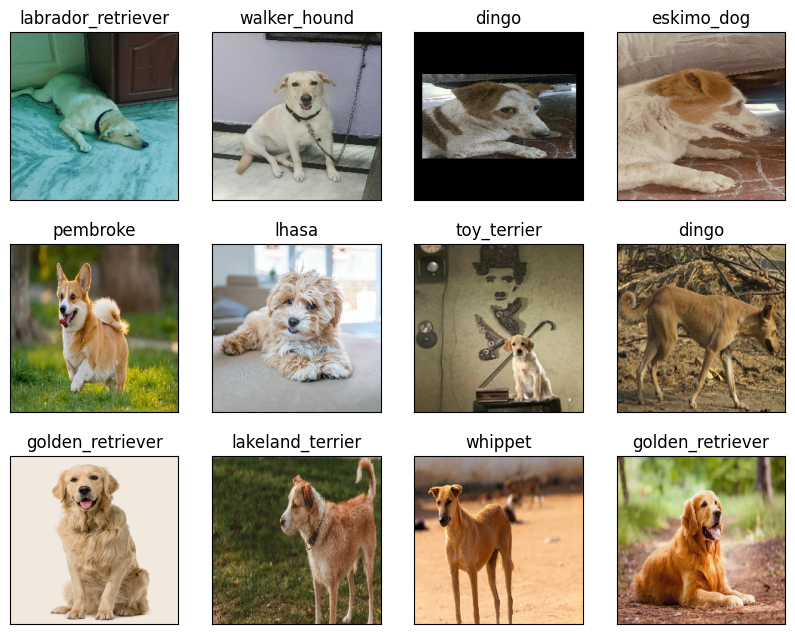

In [145]:
# check custom image predictions
plt.figure(figsize=(10,8))
for i, image in enumerate(custom_images):
  plt.subplot(3,4,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

plt.subplots_adjust(hspace=0.1)

plt.show()